# Neural Style Transfer 

In [1]:
from torchvision.models import vgg
import torchvision
import torchvision.transforms as transforms
import torch
from torch import nn
from torch.autograd import Variable
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv


C:\Users\gurus\anaconda3\envs\Learning_DS_ML_DL\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
if torch.cuda.is_available():
    print('Num devices = ', torch.cuda.device_count())
    print('Device Name = ', torch.cuda.get_device_name(0))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('device = ',device)

Num devices =  1
Device Name =  NVIDIA GeForce RTX 2060 with Max-Q Design
device =  cuda


In [3]:
#mean=[0.485, 0.456, 0.406]
#std=[0.229, 0.224, 0.225]
mean=[123.675, 116.28, 103.53]
std=[1, 1, 1]

def get_image(image_path, image_shape=None, device='cpu'):
    
    #[channels, height, width].
    image = torchvision.io.read_image(image_path) / 1.0
    #image = np.array(Image.open(image_path))

    image = image/255.0
    
    #[batch_size, channels, height, width].
    #image = np.expand_dims(image, 0)
    image = torch.unsqueeze(image, 0)

    transform = transforms.Compose([
        transforms.Normalize(mean=mean, std=std)
    ])
    
    #image = transform(image)
    image = image.to(device)
    
    print(image_path, '- ', image.shape)
    
    return image

In [4]:
content_image = get_image('content_image_8.jpg', device=device)
style_image = get_image('style_image_10.jpg', device=device)

content_image_8.jpg -  torch.Size([1, 3, 1104, 736])
style_image_10.jpg -  torch.Size([1, 3, 476, 736])


In [5]:
def display_image(image):
    
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #image = image.reshape( (image.shape[1], image.shape[2], image.shape[0]) )
    
    if len(image.shape) == 4:
        image = image.squeeze()
    
    plt.imshow(image.T)
    plt.show()

In [6]:
class vgg16_truncated(torch.nn.Module):
    
    def __init__(self):
        super().__init__()
        
        pre_trained_vgg16_model = vgg.vgg16(weights=vgg.VGG16_Weights)
        
        self.layer_set_names = ['conv3-64', 'conv3-128', 'conv3-256', 'conv3-512']

        self.layers_1 = nn.Sequential()
        self.layers_2 = nn.Sequential()
        self.layers_3 = nn.Sequential()
        self.layers_4 = nn.Sequential()
        
        for x in range(4):
            self.layers_1.add_module(str(x), pre_trained_vgg16_model.features[x])
        for x in range(4, 9):
            self.layers_2.add_module(str(x), pre_trained_vgg16_model.features[x])
        for x in range(9, 16):
            self.layers_3.add_module(str(x), pre_trained_vgg16_model.features[x])
        for x in range(16, 23):
            self.layers_4.add_module(str(x), pre_trained_vgg16_model.features[x])
            
        for param in self.parameters():
            param.requires_grad = False

    def forward(self, x):
        out1 = self.layers_1(x)
        out2 = self.layers_2(out1)
        out3 = self.layers_3(out2)
        out4 = self.layers_4(out3)
        return dict(zip(self.layer_set_names,[out1.squeeze(), out2.squeeze(), out3.squeeze(), out4.squeeze()]))


In [7]:
nst_vgg16_net = vgg16_truncated()
nst_vgg16_net.to(device).eval()


C:\Users\gurus\anaconda3\envs\Learning_DS_ML_DL\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


vgg16_truncated(
  (layers_1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (layers_2): Sequential(
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
  )
  (layers_3): Sequential(
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=

In [8]:
def gram_matrix(x):
    x = x.unsqueeze(0)
    (b, ch, h, w) = x.size()
    features = x.view(b, ch, w * h)
    features_t = features.transpose(1, 2)
    gram = features.bmm(features_t)
    gram /= ch * h * w
    return gram

In [9]:
def varaiation_loss_fn(x):
    return torch.sum(torch.abs(x[:, :, :, :-1] - x[:, :, :, 1:])) + torch.sum(torch.abs(x[:, :, :-1, :] - x[:, :, 1:, :]))

In [10]:
output_image = Variable(content_image, requires_grad=True)
# TODO: Resize image to content image
print(output_image.shape)

torch.Size([1, 3, 1104, 736])


In [11]:
target_content_feature_map = nst_vgg16_net(content_image)['conv3-64']
target_style_feature_maps = nst_vgg16_net(style_image)

print(target_content_feature_map.shape)

torch.Size([64, 1104, 736])


In [12]:
target_gram_matrices = []

for feature_map_name in target_style_feature_maps:
    target_gram_matrices.append(gram_matrix(target_style_feature_maps[feature_map_name]))
    
print(target_gram_matrices[0].shape)

torch.Size([1, 64, 64])


In [24]:
optimizer = torch.optim.Adam((output_image,), lr=0.01)

In [25]:
training_params = {"iterations" : 200,
                   "content_weight" : 1e6,
                   "style_weight" : 1e6,
                   "variation_loss" : 2,
                  "output_image_path": './out_image_dump/'}
history = {'total_loss':[], 'content_loss':[], 'style_loss':[]}

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


iteration 0


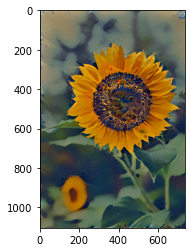

total_loss =  377933.125
iteration 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


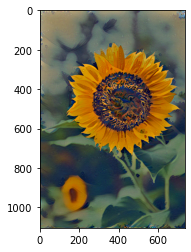

total_loss =  358416.9375
iteration 2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


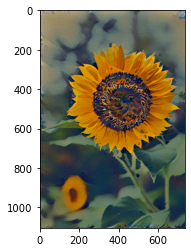

total_loss =  319682.78125
iteration 3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


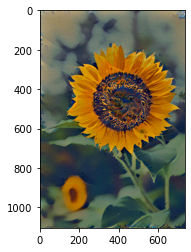

total_loss =  307500.40625
iteration 4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


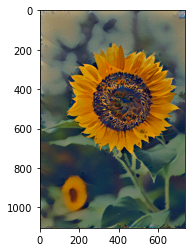

total_loss =  300131.28125
iteration 5


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


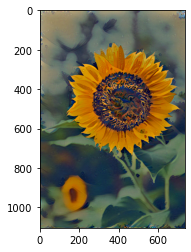

total_loss =  295136.28125
iteration 6


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


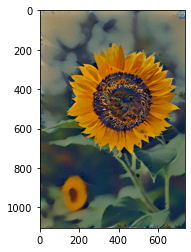

total_loss =  290471.125
iteration 7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


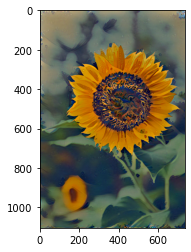

total_loss =  284383.96875
iteration 8


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


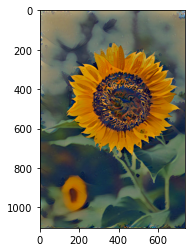

total_loss =  279566.71875
iteration 9


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


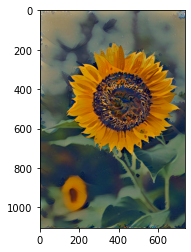

total_loss =  275466.6875
iteration 10


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


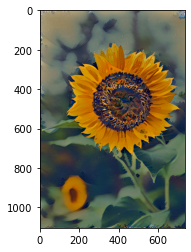

total_loss =  272027.875
iteration 11


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


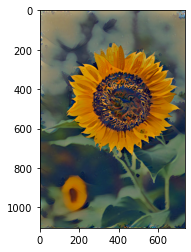

total_loss =  269103.3125
iteration 12


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


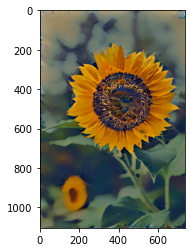

total_loss =  266174.28125
iteration 13


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


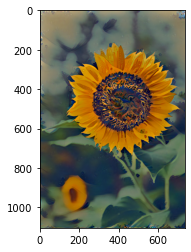

total_loss =  263465.3125
iteration 14


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


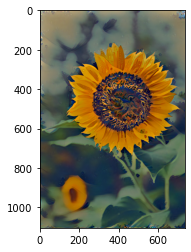

total_loss =  261056.03125
iteration 15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


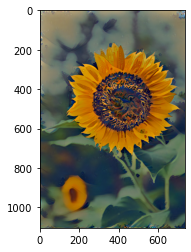

total_loss =  258907.546875
iteration 16


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


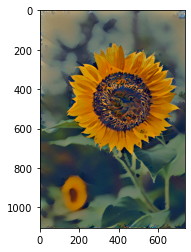

total_loss =  257011.40625
iteration 17


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


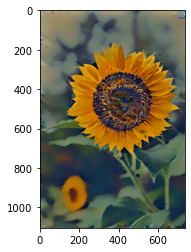

total_loss =  255222.203125
iteration 18


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


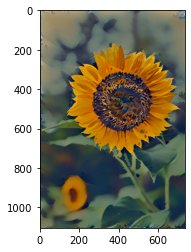

total_loss =  253498.5625
iteration 19


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


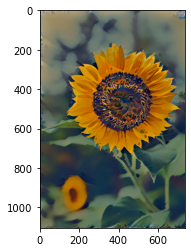

total_loss =  251932.765625
iteration 20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


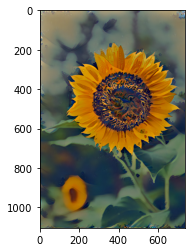

total_loss =  250504.671875
iteration 21


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


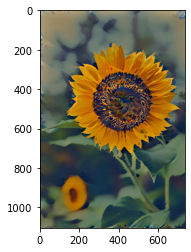

total_loss =  249196.296875
iteration 22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


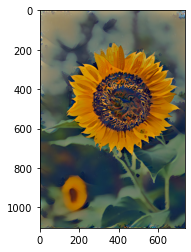

total_loss =  247997.78125
iteration 23


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


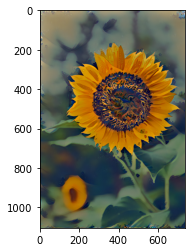

total_loss =  246872.15625
iteration 24


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


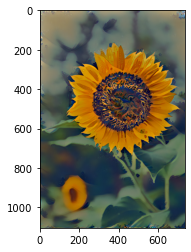

total_loss =  245818.4375
iteration 25


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


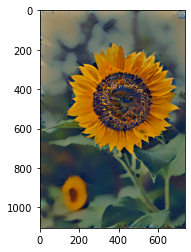

total_loss =  244850.34375
iteration 26


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


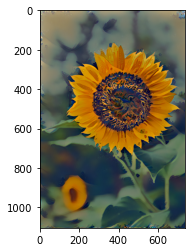

total_loss =  243942.03125
iteration 27


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


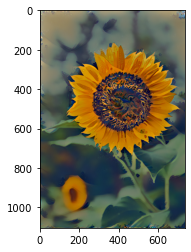

total_loss =  243115.921875
iteration 28


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


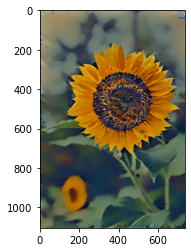

total_loss =  242346.78125
iteration 29


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


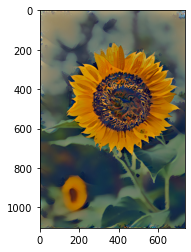

total_loss =  241624.046875
iteration 30


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


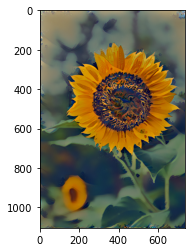

total_loss =  240966.71875
iteration 31


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


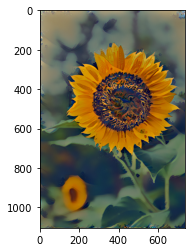

total_loss =  240348.4375
iteration 32


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


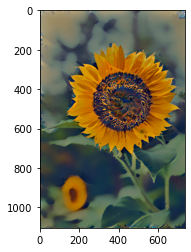

total_loss =  239777.421875
iteration 33


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


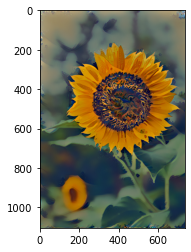

total_loss =  239258.328125
iteration 34


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


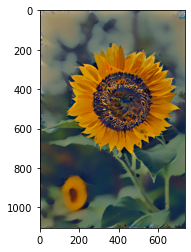

total_loss =  238762.21875
iteration 35


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


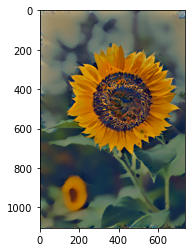

total_loss =  238309.6875
iteration 36


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


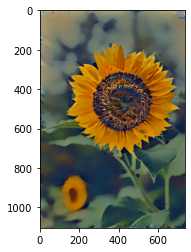

total_loss =  237888.96875
iteration 37


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


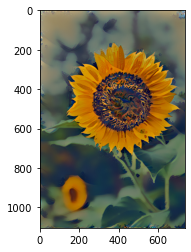

total_loss =  237503.375
iteration 38


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


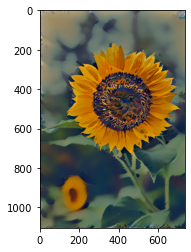

total_loss =  237138.5625
iteration 39


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


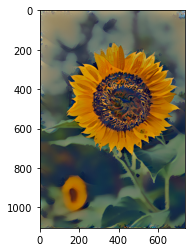

total_loss =  236803.21875
iteration 40


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


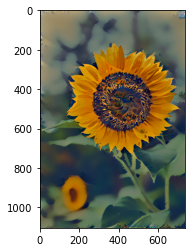

total_loss =  236483.21875
iteration 41


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


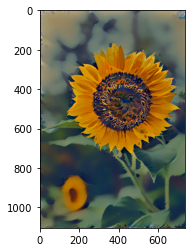

total_loss =  236197.59375
iteration 42


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


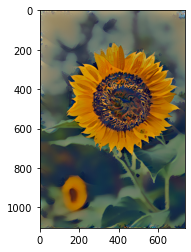

total_loss =  235929.34375
iteration 43


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


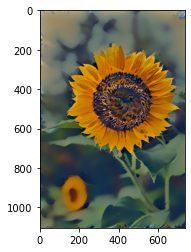

total_loss =  235682.390625
iteration 44


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


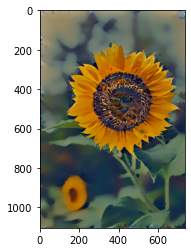

total_loss =  235453.875
iteration 45


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


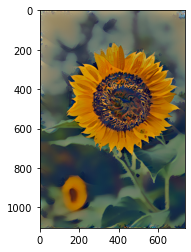

total_loss =  235238.03125
iteration 46


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


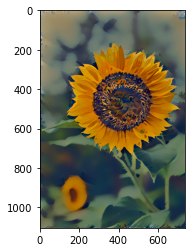

total_loss =  235034.671875
iteration 47


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


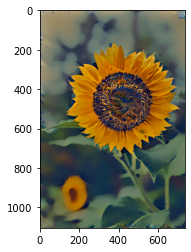

total_loss =  234845.53125
iteration 48


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


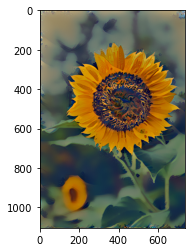

total_loss =  234677.984375
iteration 49


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


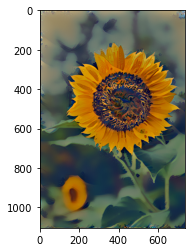

total_loss =  234523.5625
iteration 50


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


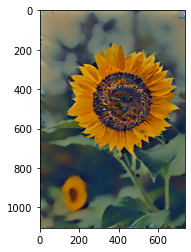

total_loss =  234368.25
iteration 51


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


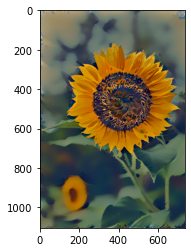

total_loss =  234229.828125
iteration 52


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


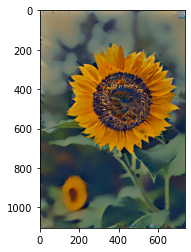

total_loss =  234102.0
iteration 53


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


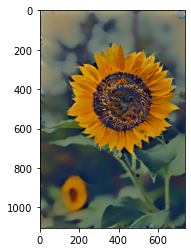

total_loss =  233981.03125
iteration 54


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


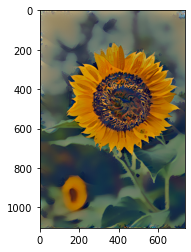

total_loss =  233863.53125
iteration 55


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


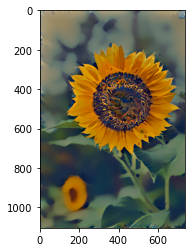

total_loss =  233753.59375
iteration 56


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


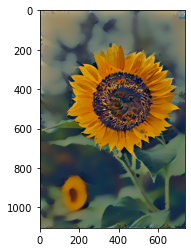

total_loss =  233650.65625
iteration 57


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


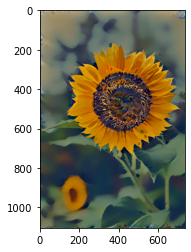

total_loss =  233559.203125
iteration 58


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


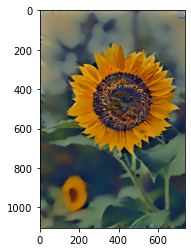

total_loss =  233467.25
iteration 59


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


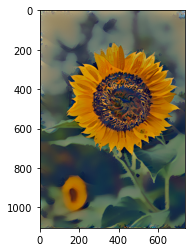

total_loss =  233386.984375
iteration 60


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


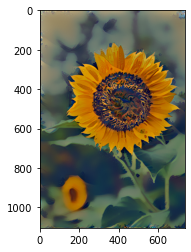

total_loss =  233313.28125
iteration 61


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


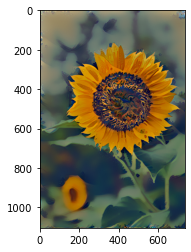

total_loss =  233232.390625
iteration 62


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


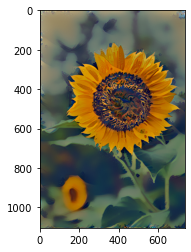

total_loss =  233174.15625
iteration 63


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


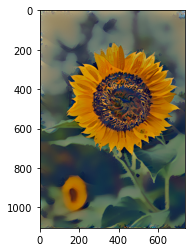

total_loss =  233110.09375
iteration 64


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


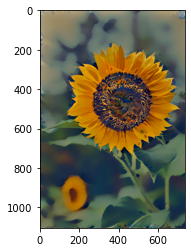

total_loss =  233045.5625
iteration 65


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


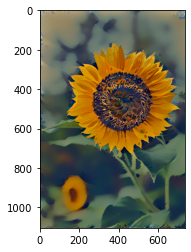

total_loss =  232983.34375
iteration 66


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


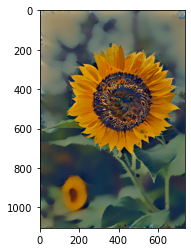

total_loss =  232926.59375
iteration 67


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


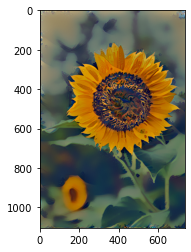

total_loss =  232873.28125
iteration 68


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


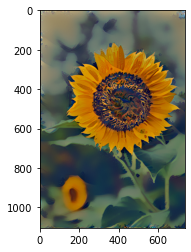

total_loss =  232827.28125
iteration 69


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


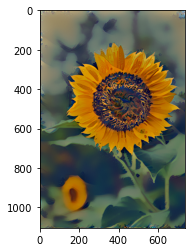

total_loss =  232778.109375
iteration 70


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


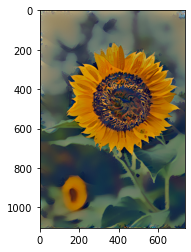

total_loss =  232722.53125
iteration 71


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


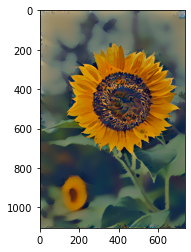

total_loss =  232680.59375
iteration 72


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


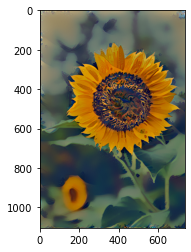

total_loss =  232650.390625
iteration 73


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


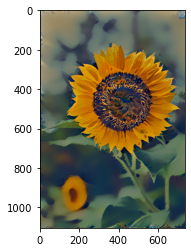

total_loss =  232608.5
iteration 74


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


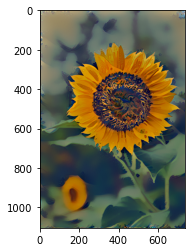

total_loss =  232566.21875
iteration 75


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


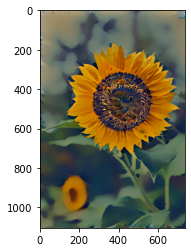

total_loss =  232533.6875
iteration 76


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


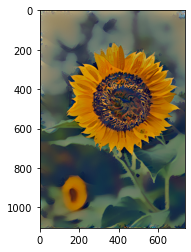

total_loss =  232491.25
iteration 77


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


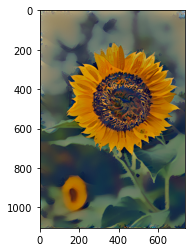

total_loss =  232452.390625
iteration 78


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


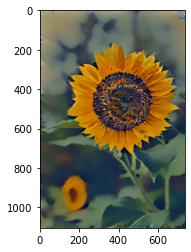

total_loss =  232429.65625
iteration 79


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


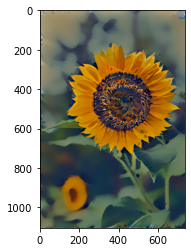

total_loss =  232396.015625
iteration 80


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


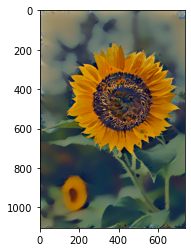

total_loss =  232362.515625
iteration 81


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


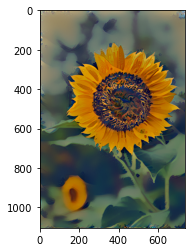

total_loss =  232333.875
iteration 82


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


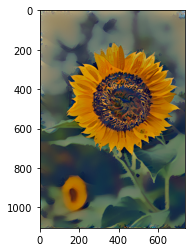

total_loss =  232301.625
iteration 83


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


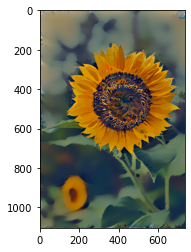

total_loss =  232269.25
iteration 84


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


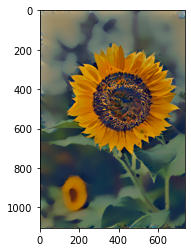

total_loss =  232248.671875
iteration 85


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


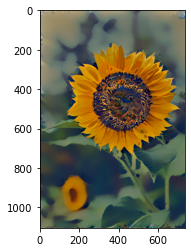

total_loss =  232225.84375
iteration 86


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


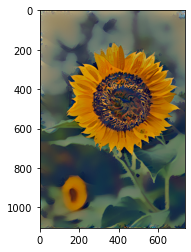

total_loss =  232195.96875
iteration 87


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


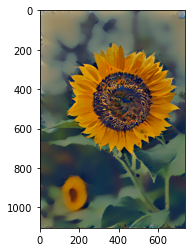

total_loss =  232159.65625
iteration 88


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


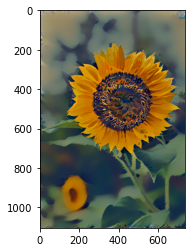

total_loss =  232141.65625
iteration 89


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


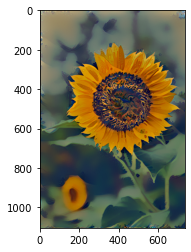

total_loss =  232119.59375
iteration 90


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


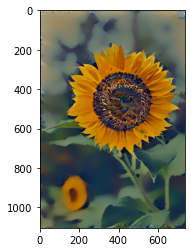

total_loss =  232093.59375
iteration 91


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


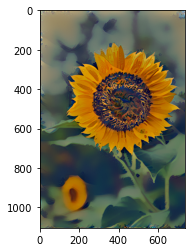

total_loss =  232069.15625
iteration 92


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


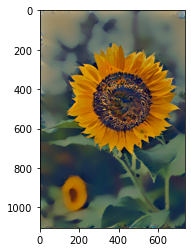

total_loss =  232043.5625
iteration 93


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


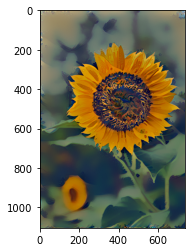

total_loss =  232020.828125
iteration 94


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


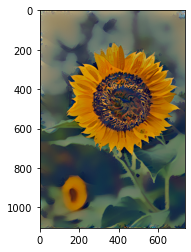

total_loss =  232005.03125
iteration 95


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


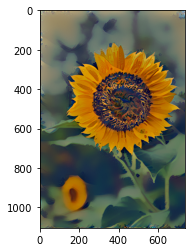

total_loss =  231978.1875
iteration 96


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


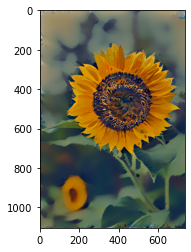

total_loss =  231958.625
iteration 97


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


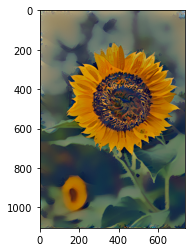

total_loss =  231936.765625
iteration 98


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


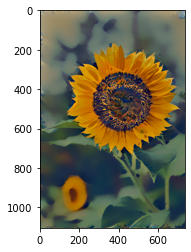

total_loss =  231910.390625
iteration 99


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


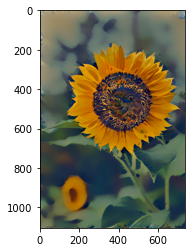

total_loss =  231895.109375
iteration 100


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


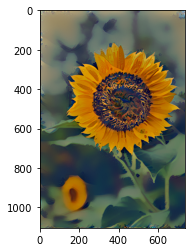

total_loss =  231879.5625
iteration 101


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


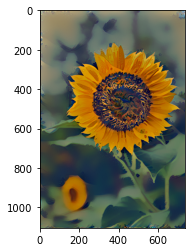

total_loss =  231851.8125
iteration 102


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


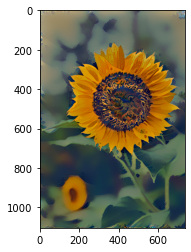

total_loss =  231826.796875
iteration 103


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


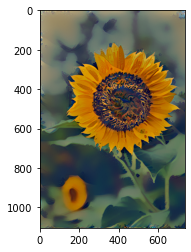

total_loss =  231810.484375
iteration 104


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


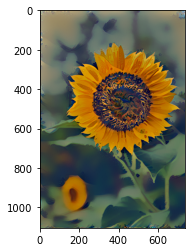

total_loss =  231795.46875
iteration 105


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


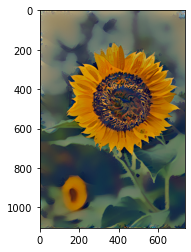

total_loss =  231775.734375
iteration 106


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


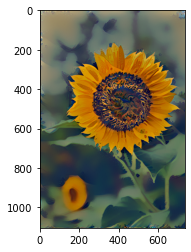

total_loss =  231761.203125
iteration 107


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


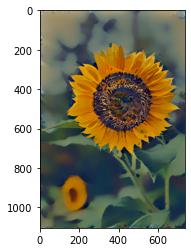

total_loss =  231733.609375
iteration 108


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


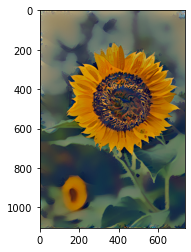

total_loss =  231726.3125
iteration 109


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


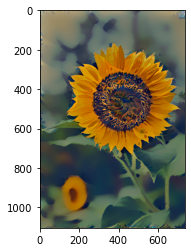

total_loss =  231715.6875
iteration 110


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


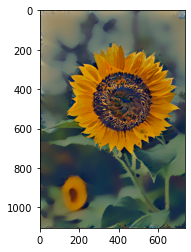

total_loss =  231693.625
iteration 111


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


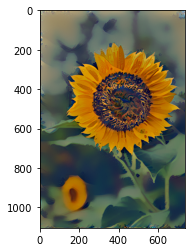

total_loss =  231670.578125
iteration 112


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


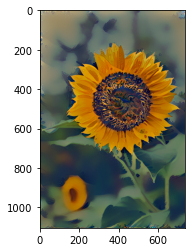

total_loss =  231653.375
iteration 113


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


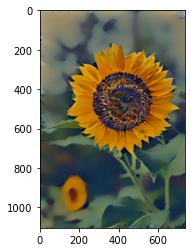

total_loss =  231644.34375
iteration 114


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


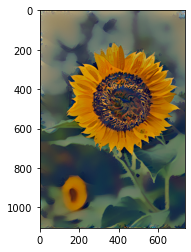

total_loss =  231634.78125
iteration 115


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


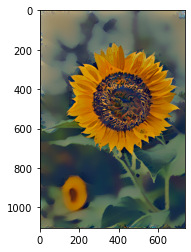

total_loss =  231618.5625
iteration 116


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


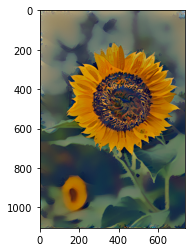

total_loss =  231594.90625
iteration 117


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


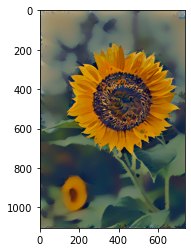

total_loss =  231580.03125
iteration 118


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


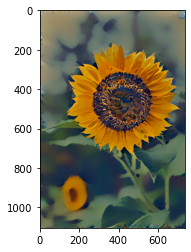

total_loss =  231569.21875
iteration 119


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


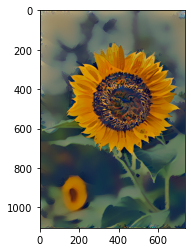

total_loss =  231553.5
iteration 120


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


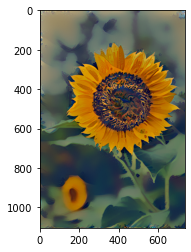

total_loss =  231543.65625
iteration 121


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


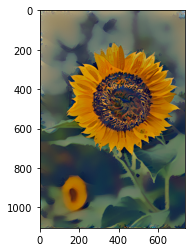

total_loss =  231531.015625
iteration 122


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


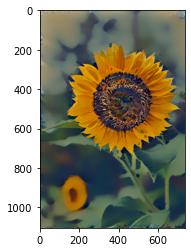

total_loss =  231517.5
iteration 123


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


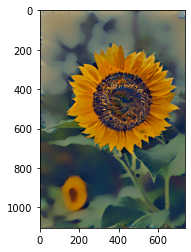

In [ ]:
for i in range(training_params["iterations"]):
    
    print('iteration', i)
    
    with torch.no_grad():
        image_filename = 'out_image_' + str(i) + '.jpg'

        output_image_for_display = np.rot90(np.rot90(np.rot90(output_image.squeeze(0).cpu().detach().numpy().T)))
        #output_image_for_display += np.array(mean).reshape((1, 1, 3))
        plt.imshow(output_image_for_display)
        #plt.savefig(training_params['output_image_path'] + image_filename)
        plt.show()
        
        output_image_save = output_image.clone().detach().cpu()
        #output_image_save += torch.Tensor(mean).reshape((1, 3, 1, 1))
        #output_image_save = torch.clip(output_image_save, 0, 255)
        #output_image_save = output_image_save.to(torch.int8)
        torchvision.utils.save_image(output_image_save, training_params['output_image_path'] + image_filename)
        
        #output_image_save = output_image.detach().cpu().numpy()
        #output_image_save = np.squeeze(output_image_save, axis=0)
        #output_image_save = np.moveaxis(output_image_save, 0, 2)
        #output_image_save = np.copy(output_image_save)
        #output_image_save += np.array(mean).reshape((1, 1, 3))
        #output_image_save = np.clip(output_image_save, 0, 255).astype('uint8')
        #cv.imwrite(training_params['output_image_path'] + image_filename, output_image_save)
        
        

    feature_maps = nst_vgg16_net(output_image)
    current_content_feature_map = feature_maps['conv3-64']
    current_style_feature_maps = feature_maps
    
    content_loss = torch.nn.MSELoss(reduction='mean')(target_content_feature_map, current_content_feature_map)
    
    style_loss = 0.0
    gram_matrices = []
    for i,feature_map_name in enumerate(current_style_feature_maps):
        style_loss += torch.nn.MSELoss(reduction='sum')( gram_matrix(current_style_feature_maps[feature_map_name]) , target_gram_matrices[i] )
    
    varaiation_loss = varaiation_loss_fn(output_image)
    
    total_loss = training_params['style_weight'] * style_loss + \
                training_params['content_weight'] * content_loss + \
                training_params['variation_loss'] * varaiation_loss
    
    print('total_loss = ', total_loss.item())
    history['total_loss'].append(total_loss.cpu().item())
    history['style_loss'].append(style_loss.cpu().item())
    history['content_loss'].append(content_loss.cpu().item())
    
    total_loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    

    

In [16]:
output_image_for_display = output_image.squeeze(0).cpu().detach().numpy().T
output_image.shape

torch.Size([1, 3, 1104, 736])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


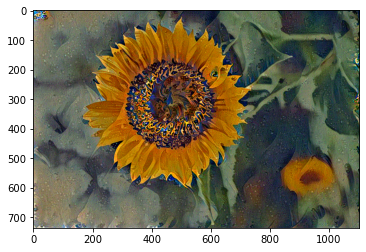

In [17]:
plt.imshow(output_image_for_display)

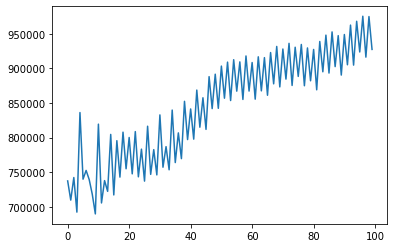

In [18]:
plt.plot(history['total_loss'][100:])

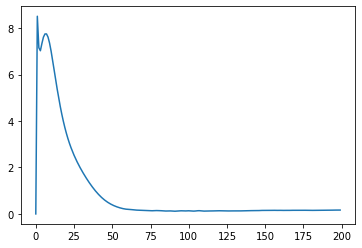

In [19]:
plt.plot(history['content_loss'])

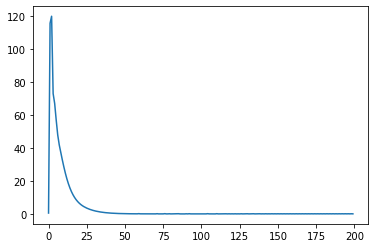

In [20]:
plt.plot(history['style_loss'])